# Crops_Classification_CNN
Dataset: Crop Classification
https://universe.roboflow.com/jeyajeev/crop-detection-etbjz

Made by Hilal Rosyid Putra

#Mounting from drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import os
import cv2
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define paths to your CSV files
train_csv = '/content/drive/My Drive/pcd_crop_multiclass/train/_classes.csv'
test_csv = '/content/drive/My Drive/pcd_crop_multiclass/test/_classes.csv'
val_csv = '/content/drive/My Drive/pcd_crop_multiclass/valid/_classes.csv'

# Load the CSV files into DataFrames
train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)
val_df = pd.read_csv(val_csv)

print(train_df.columns)
print(val_df.columns)
print(test_df.columns)




Index(['filename', ' corn', ' cotton', ' crops', ' rice', ' wheat'], dtype='object')
Index(['filename', ' corn', ' cotton', ' crops', ' rice', ' wheat'], dtype='object')
Index(['filename', ' corn', ' cotton', ' crops', ' rice', ' wheat'], dtype='object')


#Eksplorasi Jumlah Data Train, Validasi, Test

Jumlah data pada data train ada 1317
Jumlah data pada data validasi ada 282
Jumlah data pada data test ada 282


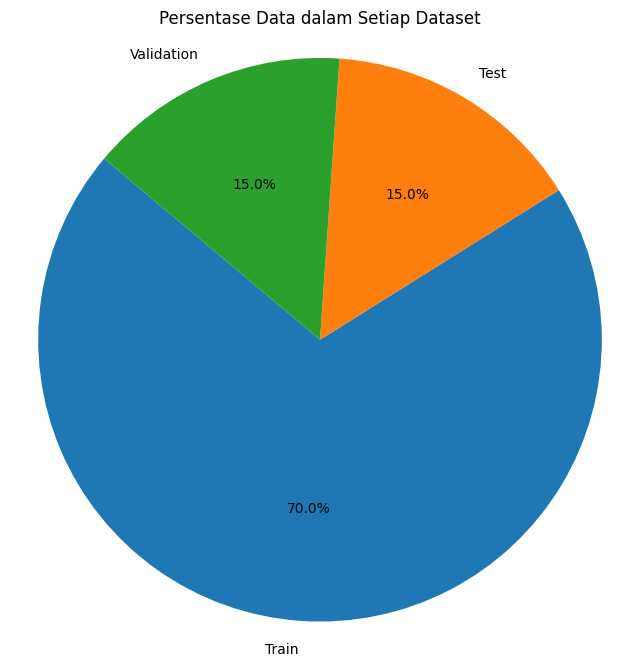

In [ ]:
print("Jumlah data pada data train ada",train_df['filename'].notnull().sum())

print("Jumlah data pada data validasi ada",val_df['filename'].notnull().sum())

print("Jumlah data pada data test ada",test_df['filename'].notnull().sum())

# Menghitung jumlah data yang tidak null dalam setiap dataset
train_count = train_df['filename'].notnull().sum()
test_count = test_df['filename'].notnull().sum()
val_count = val_df['filename'].notnull().sum()

# Menyimpan jumlah data dalam sebuah dictionary
data_counts = {'Train': train_count, 'Test': test_count, 'Validation': val_count}

# Menggambar pie chart
plt.figure(figsize=(8, 8))
plt.pie(data_counts.values(), labels=data_counts.keys(), autopct='%1.1f%%', startangle=140)
plt.title('Persentase Data dalam Setiap Dataset')
plt.axis('equal')
plt.show()

# Eksplorasi Jumlah Citra Antar Kelas

Jumlah citra yang termasuk kelas ' corn' dalam data train ada: 258
Jumlah citra yang termasuk kelas ' cotton' dalam data train ada: 379
Jumlah citra yang termasuk kelas ' crops' dalam data train ada: 1
Jumlah citra yang termasuk kelas ' rice' dalam data train ada: 240
Jumlah citra yang termasuk kelas ' wheat' dalam data train ada: 282


Jumlah citra yang termasuk kelas ' corn' dalam data test ada: 49
Jumlah citra yang termasuk kelas ' cotton' dalam data test ada: 89
Jumlah citra yang termasuk kelas ' crops' dalam data test ada: 0
Jumlah citra yang termasuk kelas ' rice' dalam data test ada: 49
Jumlah citra yang termasuk kelas ' wheat' dalam data test ada: 62


Jumlah citra yang termasuk kelas ' corn' dalam data val ada: 66
Jumlah citra yang termasuk kelas ' cotton' dalam data val ada: 78
Jumlah citra yang termasuk kelas ' crops' dalam data val ada: 0
Jumlah citra yang termasuk kelas ' rice' dalam data val ada: 56
Jumlah citra yang termasuk kelas ' wheat' dalam data val ada: 58




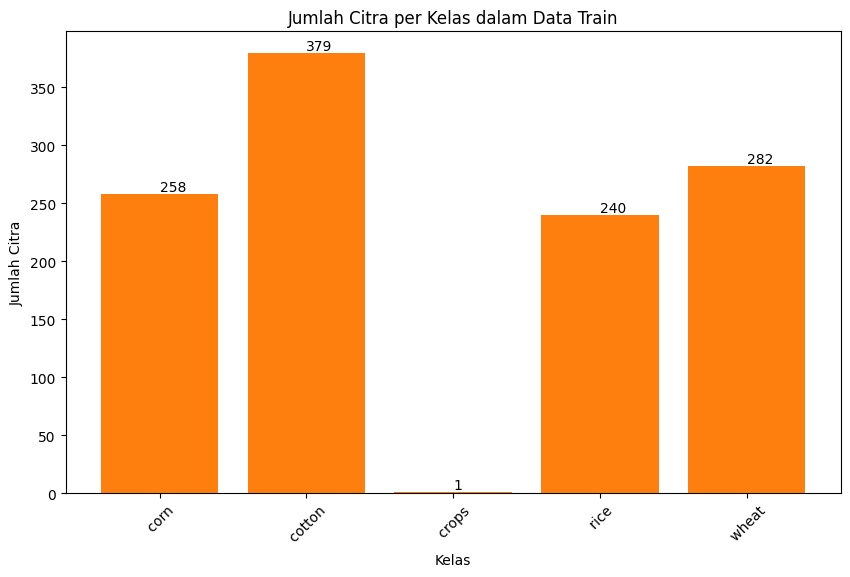

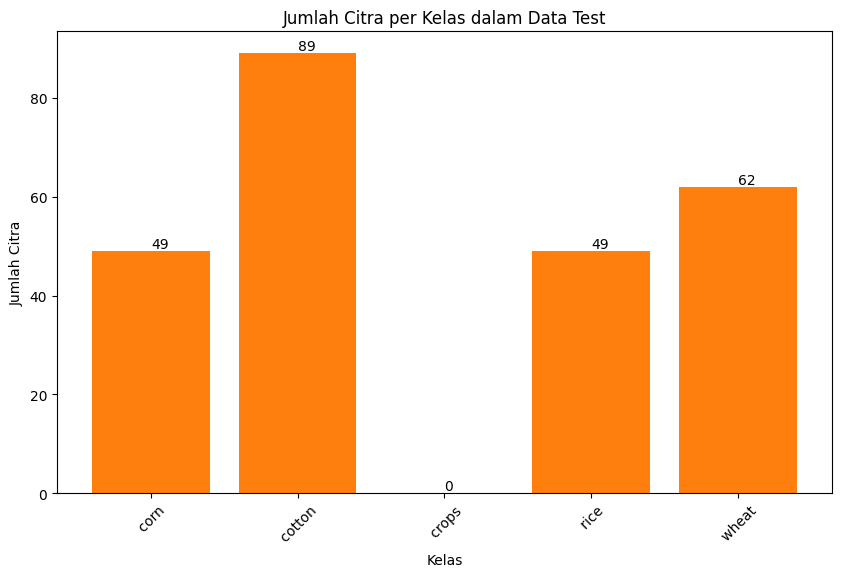

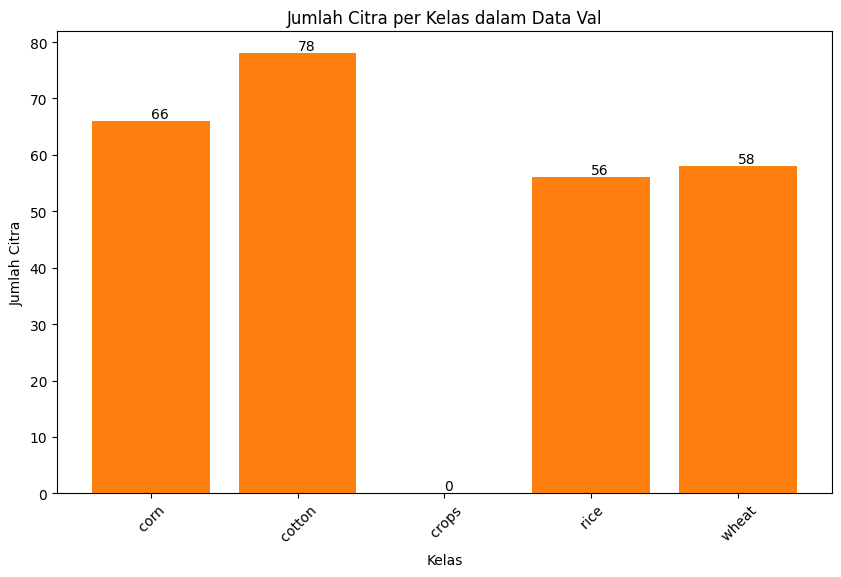

In [ ]:
classes = [' corn', ' cotton', ' crops', ' rice', ' wheat']

dataframes = {
    'train': train_df,
    'test': test_df,
    'val': val_df
}

for df_name, df in dataframes.items():
    for class_name in classes:
        count = (df[class_name] == 1).sum()
        print(f"Jumlah citra yang termasuk kelas '{class_name}' dalam data {df_name} ada: {count}")
    print("\n")

class_counts = {df_name: {class_name: (df[class_name] == 1).sum() for class_name in classes} for df_name, df in dataframes.items()}

for df_name, counts in class_counts.items():
    plt.figure(figsize=(10, 6))
    plt.bar(counts.keys(), counts.values())
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Citra')
    plt.title(f'Jumlah Citra per Kelas dalam Data {df_name.capitalize()}')
    bars = plt.bar(counts.keys(), counts.values())
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom') # va: vertical alignment
    plt.xticks(rotation=45)
    plt.show()

Menghapus citra pada kelas 'crops' karena jumlahnya sangat timpang

In [ ]:
train_df = train_df[train_df[' crops'] != 1]

In [ ]:
columns_to_be_deleted = [' crops']
train_df = train_df.drop(columns=columns_to_be_deleted)
val_df = val_df.drop(columns=columns_to_be_deleted)
test_df = test_df.drop(columns=columns_to_be_deleted)

#Distribusi Pixel tiap Kelas

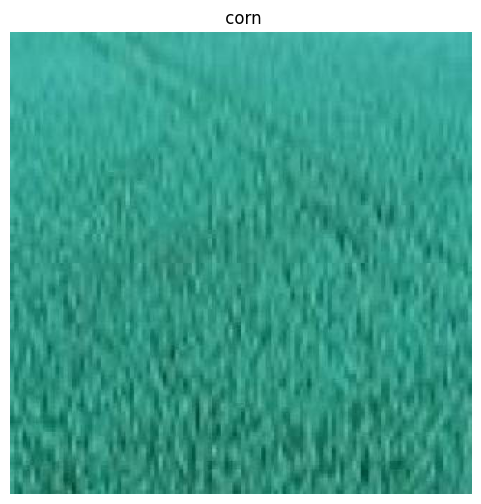

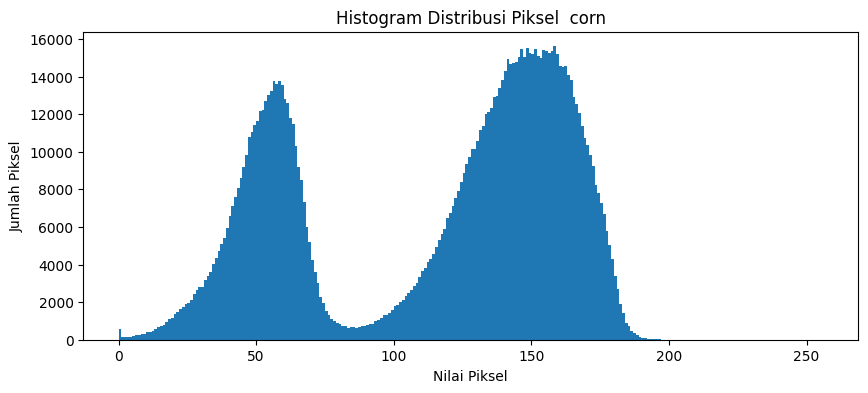

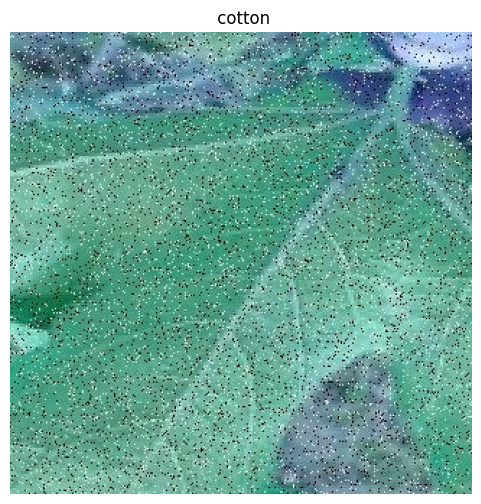

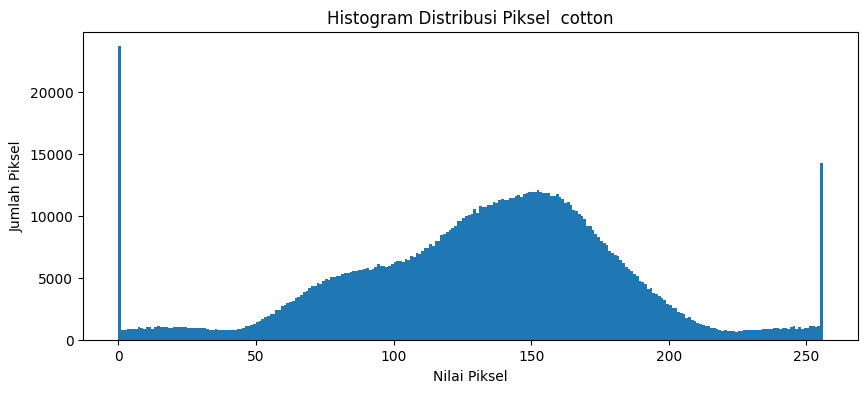

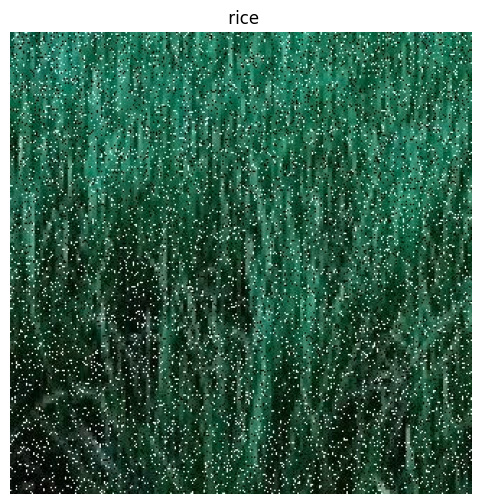

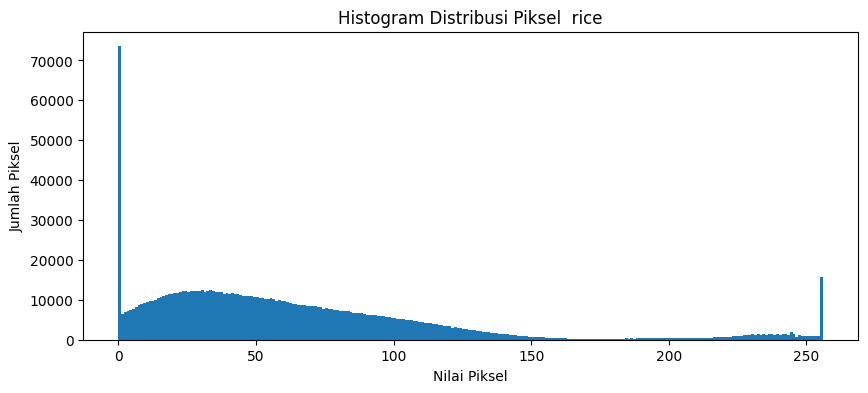

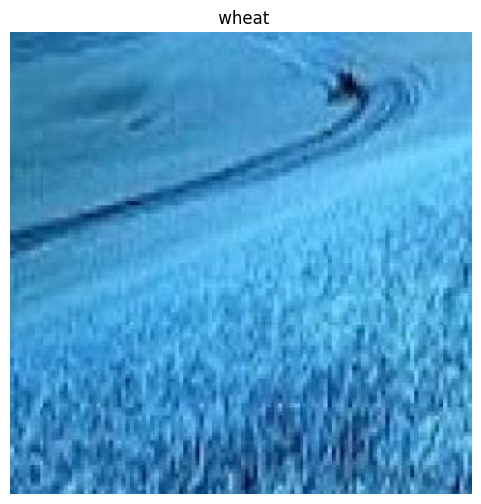

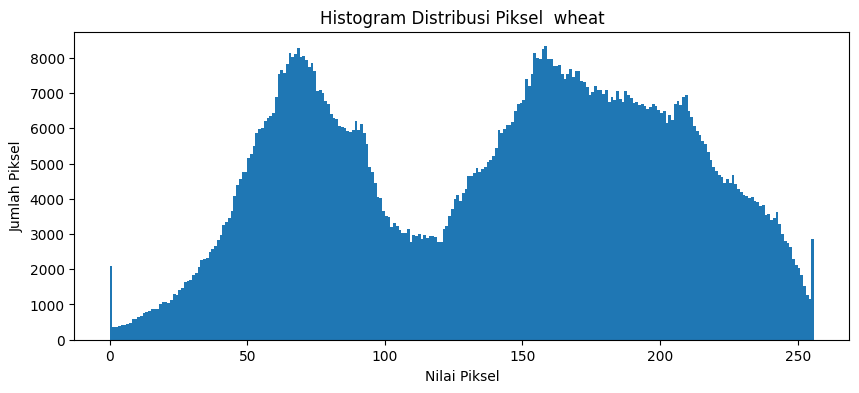

In [ ]:
classes = [' corn', ' cotton', ' rice', ' wheat']
for crop in classes:
  img_path = os.path.join('/content/drive/My Drive/pcd_crop_multiclass/train/', train_df['filename'][train_df[crop]==1].values[0])
  img = cv2.imread(img_path)
  # Menampilkan gambar asli
  plt.figure(figsize=(6, 6))
  plt.imshow(img, cmap='gray')
  plt.title(f'{crop}')
  plt.axis('off')
  plt.show()

  print('\n')

  # Membuat histogram
  plt.figure(figsize=(10, 4))
  plt.hist(img.ravel(), bins=256, range=[0,256])
  plt.title(f'Histogram Distribusi Piksel {crop}')
  plt.xlabel('Nilai Piksel')
  plt.ylabel('Jumlah Piksel')
  plt.show()

  print('\n')


#Ukuran image awal

In [ ]:
img_path = os.path.join('/content/drive/My Drive/pcd_crop_multiclass/train/', train_df['filename'][0])
img = cv2.imread(img_path)
img.shape[:2]

(640, 640)

# Load data image dan resize menjadi (224,224)

In [ ]:
def load_data_from_df(df, data_dir):
  images = []
  labels = []
  for index, row in df.iterrows():
    filename = row['filename']

    label = row[[' corn', ' cotton', ' rice', ' wheat']].values

    img_path = os.path.join(data_dir, filename)
    img = cv2.imread(img_path)
    if img is not None:
      img = cv2.resize(img, (224, 224))
      images.append(img)
      labels.append(label)

  images = np.array(images)
  labels = np.array(labels)
  return images, labels


In [ ]:
X_train, y_train = load_data_from_df(train_df,'/content/drive/My Drive/pcd_crop_multiclass/train/')
X_test, y_test = load_data_from_df(test_df,'/content/drive/My Drive/pcd_crop_multiclass/test')
X_val, y_val = load_data_from_df(val_df,'/content/drive/My Drive/pcd_crop_multiclass/valid/')



#Mengubah tipe data X_train, X_test, dan X_val menjadi float32 dan menormalisasikan nilai piksel ke rentang [0, 1]

In [ ]:
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0
X_val = X_val.astype('float32') / 255.0

y_train = y_train.astype('float32')
y_test= y_test.astype('float32')
y_val= y_val.astype('float32')

In [ ]:
print(X_train)

[[[[0.01568628 0.3137255  0.23137255]
   [0.03921569 0.32156864 0.24313726]
   [0.36862746 0.6509804  0.57254905]
   ...
   [0.05098039 0.37254903 0.2509804 ]
   [0.11372549 0.46666667 0.33333334]
   [0.0627451  0.43529412 0.3019608 ]]

  [[0.01176471 0.30588236 0.22352941]
   [0.02352941 0.28627452 0.20392157]
   [0.36078432 0.6392157  0.56078434]
   ...
   [0.02745098 0.32941177 0.20784314]
   [0.15294118 0.4862745  0.35686275]
   [0.57254905 0.9098039  0.7882353 ]]

  [[0.03921569 0.32941177 0.24705882]
   [0.09019608 0.3764706  0.29803923]
   [0.30980393 0.5921569  0.5137255 ]
   ...
   [0.07058824 0.3529412  0.23529412]
   [0.16862746 0.47058824 0.34901962]
   [0.14901961 0.45882353 0.3372549 ]]

  ...

  [[0.01960784 0.04313726 0.02352941]
   [0.02352941 0.04313726 0.02745098]
   [0.02745098 0.05490196 0.03529412]
   ...
   [0.         0.05882353 0.00784314]
   [0.11764706 0.24313726 0.1764706 ]
   [0.02352941 0.14901961 0.08235294]]

  [[0.7254902  0.7529412  0.73333335]
   [0.0

#Perancangan model

## Model tanpa optimizer

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import GlorotUniform, GlorotNormal, HeUniform, HeNormal, Orthogonal
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def create_model_without_optimizer():
    model = models.Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=X_train.shape[1:], kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(256, activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(4, activation='softmax', kernel_initializer=GlorotNormal()))

    model.compile(loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model_without_optimizer = create_model_without_optimizer()
model_without_optimizer.summary()




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 111, 111, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                        

##Model dengan optimizer Adam learning rate=0.001

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import GlorotUniform, GlorotNormal, HeUniform, HeNormal, Orthogonal
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def create_model_adam_1():
    model = models.Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=X_train.shape[1:], kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(256, activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(4, activation='softmax', kernel_initializer=GlorotNormal()))

    optimizer = Adam(lr=0.001)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model_adam_1 = create_model_adam_1()
model_adam_1.summary()




Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 batch_normalization_5 (Bat  (None, 111, 111, 32)      128       
 chNormalization)                                                
                                                                 
 conv2d_5 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                      

##Model dengan optimizer Adam learning rate=0.0001

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import GlorotUniform, GlorotNormal, HeUniform, HeNormal, Orthogonal
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def create_model_adam_2():
    model = models.Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=X_train.shape[1:], kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(256, activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(4, activation='softmax', kernel_initializer=GlorotNormal()))

    optimizer = Adam(lr=0.0001)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model_adam_2 = create_model_adam_2()
model_adam_2.summary()




Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 batch_normalization_10 (Ba  (None, 111, 111, 32)      128       
 tchNormalization)                                               
                                                                 
 conv2d_9 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                      

##Model dengan optimizer Adamax learning rate=0.001

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.initializers import GlorotUniform, GlorotNormal, HeUniform, HeNormal, Orthogonal
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def create_model_adamax_1():
    model = models.Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=X_train.shape[1:], kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(256, activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(4, activation='softmax', kernel_initializer=GlorotNormal()))

    optimizer = Adamax(lr=0.001)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model_adamax_1 = create_model_adamax_1()
model_adamax_1.summary()




Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 batch_normalization_15 (Ba  (None, 111, 111, 32)      128       
 tchNormalization)                                               
                                                                 
 conv2d_13 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                      

##Model dengan optimizer Adamax learning rate=0.0001

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.initializers import GlorotUniform, GlorotNormal, HeUniform, HeNormal, Orthogonal
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def create_model_adamax_2():
    model = models.Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=X_train.shape[1:], kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(128, (5, 5), activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(256, activation='relu', kernel_initializer=HeNormal()))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(4, activation='softmax', kernel_initializer=GlorotNormal()))

    optimizer = Adamax(lr=0.0001)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model_adamax_2 = create_model_adamax_2()
model_adamax_2.summary()




Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 batch_normalization_20 (Ba  (None, 111, 111, 32)      128       
 tchNormalization)                                               
                                                                 
 conv2d_17 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                      

##Visualisasi hasil layer konvolusi

1/1 [==============================] - 0s 101ms/step


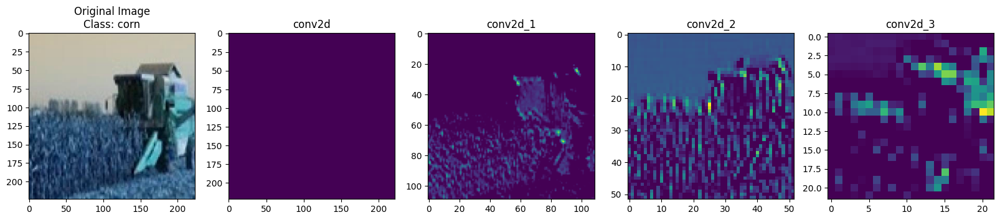

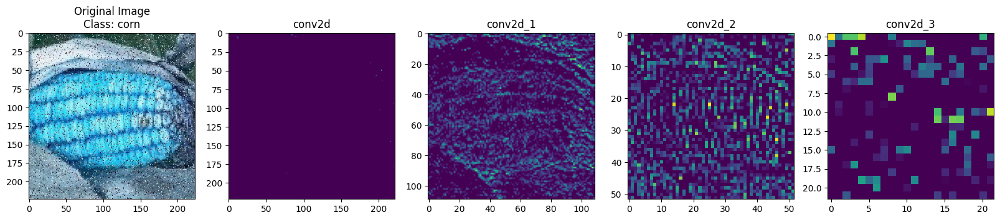

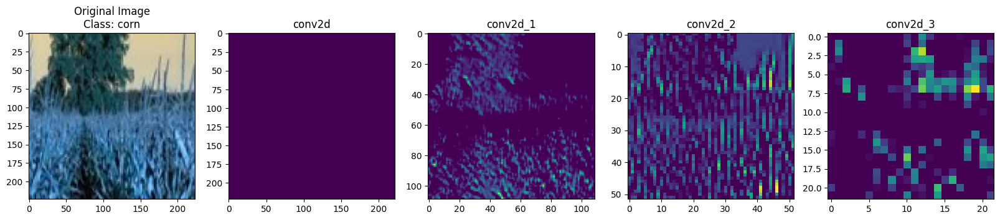

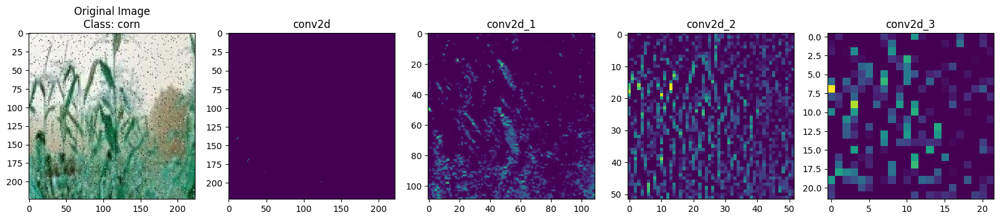

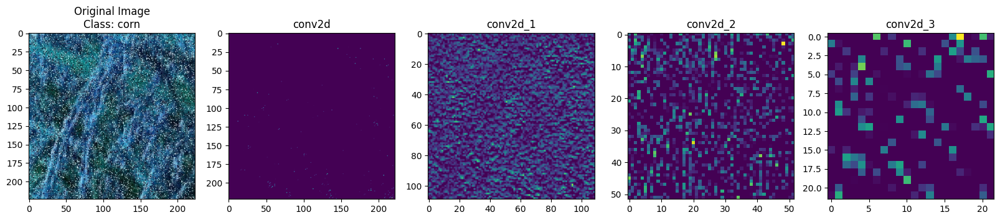

...

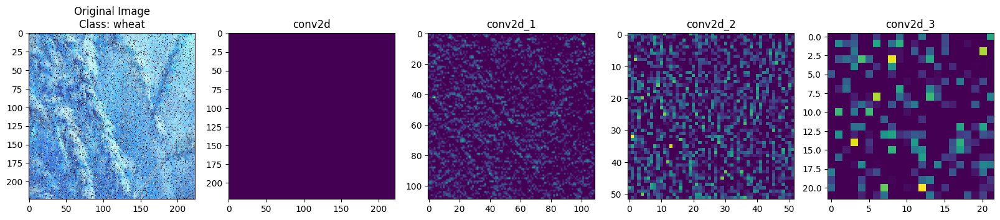

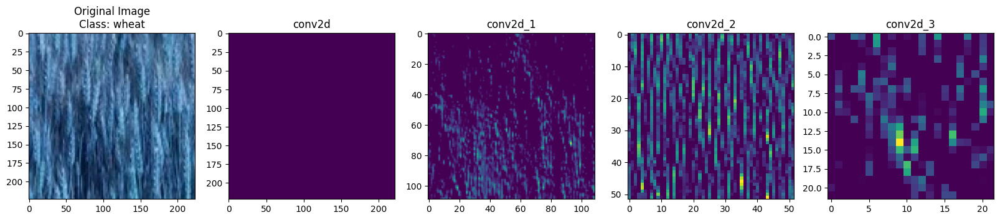

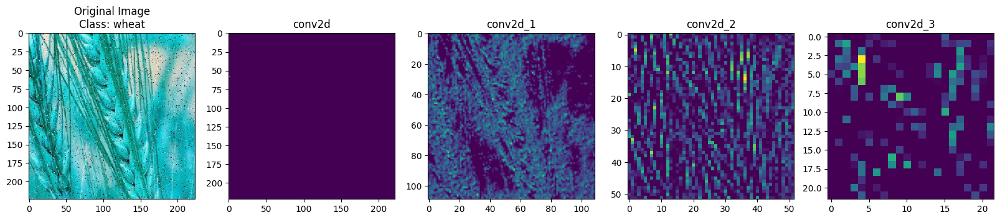

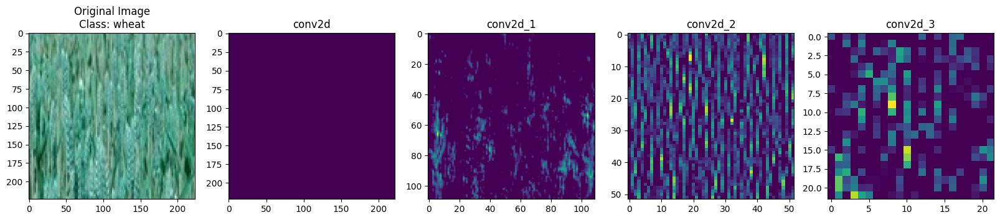

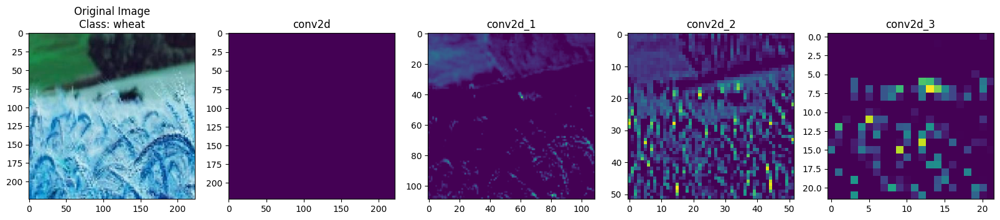

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
from tensorflow.keras import Model
from tensorflow.keras import layers

# Fungsi untuk memilih gambar acak dari setiap kelas
def select_random_images_per_class(X, y, num_classes=4, num_samples=5):
    selected_images = []
    for cls in range(num_classes):
        indices = np.where(np.argmax(y, axis=1) == cls)[0]
        selected_indices = random.sample(list(indices), num_samples)
        selected_images.extend(selected_indices)
    return selected_images

random_indices = select_random_images_per_class(X_train, y_train)
selected_images = X_train[random_indices]
selected_labels = y_train[random_indices]

layer_outputs = [layer.output for layer in model_without_optimizer.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model_without_optimizer.input, outputs=layer_outputs)

# output layer konvolusi
activations = activation_model.predict(selected_images)

# Fungsi untuk menampilkan feature maps
def display_feature_maps(activations, images, labels, layer_names, class_names):
    for i in range(len(images)):
        fig, axes = plt.subplots(1, len(layer_names) + 1, figsize=(20, 15))
        # Mengubah skala gambar asli jika diperlukan
        img = images[i]
        if np.max(img) <= 1.0:
            img = img * 255.0
        axes[0].imshow(img.astype(np.uint8))
        # Menambahkan nama kelas di title gambar asli
        class_name = class_names[np.argmax(labels[i])]
        axes[0].set_title(f'Original Image\nClass: {class_name}')
        for j, activation in enumerate(activations):
            axes[j + 1].imshow(activation[i, :, :, 0], cmap='viridis')  # Menampilkan feature map dari setiap layer
            axes[j + 1].set_title(layer_names[j])
        plt.show()

# Nama layer konvolusi
layer_names = [layer.name for layer in model_without_optimizer.layers if isinstance(layer, layers.Conv2D)]

# Daftar nama kelas
class_names = ['corn', 'cotton',  'rice', 'wheat']

# Menampilkan feature maps
display_feature_maps(activations, selected_images, selected_labels, layer_names, class_names)


#Training model

Training model tanpa optimizer

Epoch 1/50
11/11 [==============================] - 20s 609ms/step - loss: 2.0248 - accuracy: 0.4005 - val_loss: 14.8739 - val_accuracy: 0.2057
Epoch 2/50
11/11 [==============================] - 2s 223ms/step - loss: 1.0890 - accuracy: 0.5243 - val_loss: 5.1013 - val_accuracy: 0.3511
Epoch 3/50
11/11 [==============================] - 2s 222ms/step - loss: 0.9939 - accuracy: 0.5540 - val_loss: 4.5336 - val_accuracy: 0.2872
Epoch 4/50
11/11 [==============================] - 3s 234ms/step - loss: 0.8512 - accuracy: 0.5980 - val_loss: 6.4499 - val_accuracy: 0.2057
Epoch 5/50
11/11 [==============================] - 3s 296ms/step - loss: 0.6971 - accuracy: 0.6505 - val_loss: 2.4609 - val_accuracy: 0.2766
Epoch 6/50
11/11 [==============================] - 3s 242ms/step - loss: 0.6053 - accuracy: 0.6930 - val_loss: 5.6494 - val_accuracy: 0.2163
Epoch 7/50
11/11 [==============================] - 2s 227ms/step - loss: 0.5520 - accuracy: 0.7181 - val_loss: 2.9006 - val_accuracy: 0.3121
Epoc

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


11/11 [==============================] - 3s 232ms/step - loss: 0.1242 - accuracy: 0.8860 - val_loss: 0.5847 - val_accuracy: 0.7057
Epoch 22/50
11/11 [==============================] - 3s 247ms/step - loss: 0.1288 - accuracy: 0.8891 - val_loss: 0.5538 - val_accuracy: 0.7376
Epoch 23/50
11/11 [==============================] - 3s 238ms/step - loss: 0.1219 - accuracy: 0.8875 - val_loss: 0.7526 - val_accuracy: 0.6099
Epoch 24/50
11/11 [==============================] - 2s 222ms/step - loss: 0.1486 - accuracy: 0.8716 - val_loss: 0.5814 - val_accuracy: 0.6773
Epoch 25/50
11/11 [==============================] - 3s 229ms/step - loss: 0.1248 - accuracy: 0.8944 - val_loss: 0.5973 - val_accuracy: 0.7234
Epoch 26/50
11/11 [==============================] - 2s 219ms/step - loss: 0.1249 - accuracy: 0.8906 - val_loss: 0.8670 - val_accuracy: 0.6454
Epoch 27/50
11/11 [==============================] - 3s 237ms/step - loss: 0.1575 - accuracy: 0.8807 - val_loss: 0.7788 - val_accuracy: 0.6489
Epoch 28/50

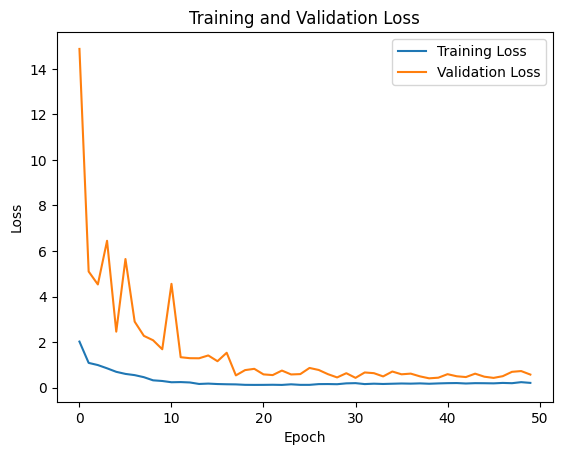

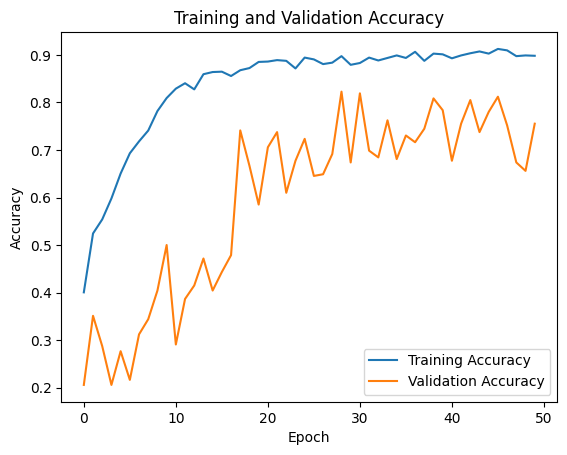

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
import matplotlib.pyplot as plt

# Directory tempat model akan disimpan
checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback untuk menyimpan model pada epoch tertentu
def save_model_at_epoch(epoch, logs):
    if epoch in [19, 29, 49]:  # Epoch dalam callback dimulai dari 0
        model_save_path = os.path.join(checkpoint_dir, f'model_without_optimizer_epoch_{epoch+1}.h5')
        model_without_optimizer.save(model_save_path)
        print(f'\nModel saved at epoch {epoch+1} to {model_save_path}')

save_model_callback = LambdaCallback(on_epoch_end=save_model_at_epoch)

# Batch size untuk pelatihan model
batch_size = 128

# Jumlah epoch yang akan dilakukan selama pelatihan
epochs = 50

# Callback checkpoint_callback dan save_model_callback digunakan untuk menyimpan model terbaik selama pelatihan
history = model_without_optimizer.fit(X_train, y_train, batch_size=batch_size,
                    epochs=epochs, validation_data=(X_val, y_val),
                    callbacks=[save_model_callback])

# Plot training dan validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training dan validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Training model optimizer Adam

Epoch 1/50
11/11 [==============================] - 7s 291ms/step - loss: 1.6365 - accuracy: 0.4331 - val_loss: 6.4693 - val_accuracy: 0.2766
Epoch 2/50
11/11 [==============================] - 3s 242ms/step - loss: 0.8377 - accuracy: 0.5851 - val_loss: 5.7225 - val_accuracy: 0.2979
Epoch 3/50
11/11 [==============================] - 3s 283ms/step - loss: 0.7172 - accuracy: 0.6436 - val_loss: 3.6756 - val_accuracy: 0.3759
Epoch 4/50
11/11 [==============================] - 2s 222ms/step - loss: 0.6096 - accuracy: 0.6862 - val_loss: 3.6154 - val_accuracy: 0.3262
Epoch 5/50
11/11 [==============================] - 2s 222ms/step - loss: 0.5085 - accuracy: 0.7310 - val_loss: 2.8220 - val_accuracy: 0.3475
Epoch 6/50
11/11 [==============================] - 2s 223ms/step - loss: 0.3906 - accuracy: 0.7690 - val_loss: 3.3811 - val_accuracy: 0.3050
Epoch 7/50
11/11 [==============================] - 2s 222ms/step - loss: 0.3283 - accuracy: 0.7933 - val_loss: 3.0852 - val_accuracy: 0.3546
Epoch 

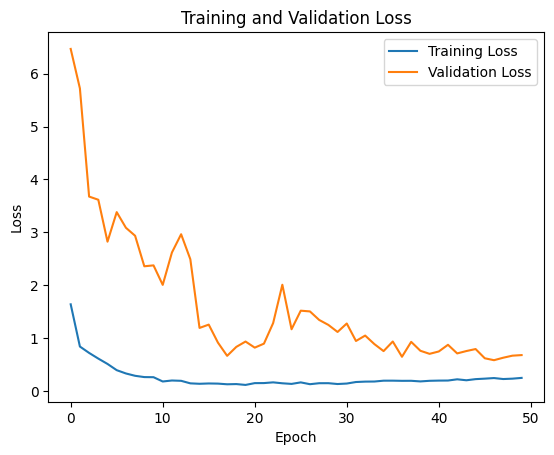

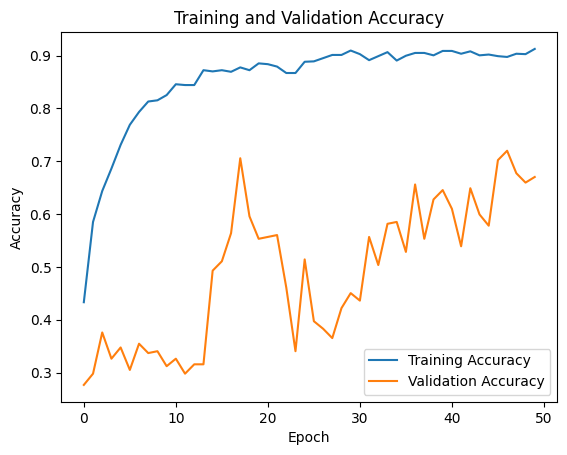

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
import matplotlib.pyplot as plt

# Directory tempat model akan disimpan
checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback untuk menyimpan model pada epoch tertentu
def save_model_at_epoch(epoch, logs):
    if epoch in [19, 29, 49]:  # Epoch dalam callback dimulai dari 0
        model_save_path = os.path.join(checkpoint_dir, f'model_adam_1_epoch_{epoch+1}.h5')
        model_adam_1.save(model_save_path)
        print(f'\nModel saved at epoch {epoch+1} to {model_save_path}')

save_model_callback = LambdaCallback(on_epoch_end=save_model_at_epoch)

# Batch size untuk pelatihan model
batch_size = 128

# Jumlah epoch yang akan dilakukan selama pelatihan
epochs = 50

# Callback checkpoint_callback dan save_model_callback digunakan untuk menyimpan model terbaik selama pelatihan
history = model_adam_1.fit(X_train, y_train, batch_size=batch_size,
                    epochs=epochs, validation_data=(X_val, y_val),
                    callbacks=[save_model_callback])

# Plot training dan validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training dan validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Epoch 1/50
11/11 [==============================] - 7s 287ms/step - loss: 1.7702 - accuracy: 0.4309 - val_loss: 12.2081 - val_accuracy: 0.2730
Epoch 2/50
11/11 [==============================] - 2s 221ms/step - loss: 1.1533 - accuracy: 0.4635 - val_loss: 4.3266 - val_accuracy: 0.3121
Epoch 3/50
11/11 [==============================] - 2s 222ms/step - loss: 0.9819 - accuracy: 0.5380 - val_loss: 4.4316 - val_accuracy: 0.2270
Epoch 4/50
11/11 [==============================] - 3s 292ms/step - loss: 0.8092 - accuracy: 0.5866 - val_loss: 3.3238 - val_accuracy: 0.2624
Epoch 5/50
11/11 [==============================] - 3s 284ms/step - loss: 0.6506 - accuracy: 0.6497 - val_loss: 2.5745 - val_accuracy: 0.3404
Epoch 6/50
11/11 [==============================] - 3s 235ms/step - loss: 0.6465 - accuracy: 0.6847 - val_loss: 2.7310 - val_accuracy: 0.2837
Epoch 7/50
11/11 [==============================] - 2s 225ms/step - loss: 0.4838 - accuracy: 0.7340 - val_loss: 1.8525 - val_accuracy: 0.3546
Epoch

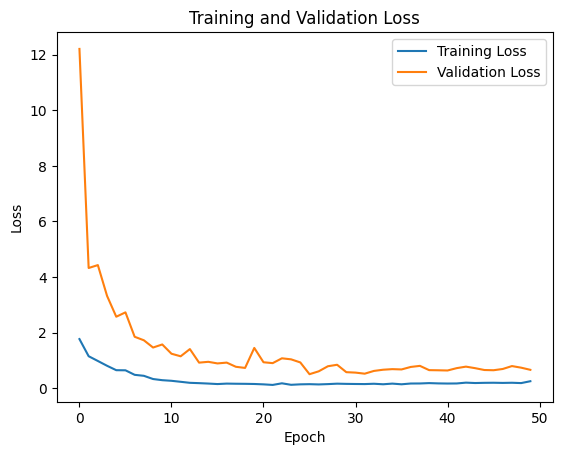

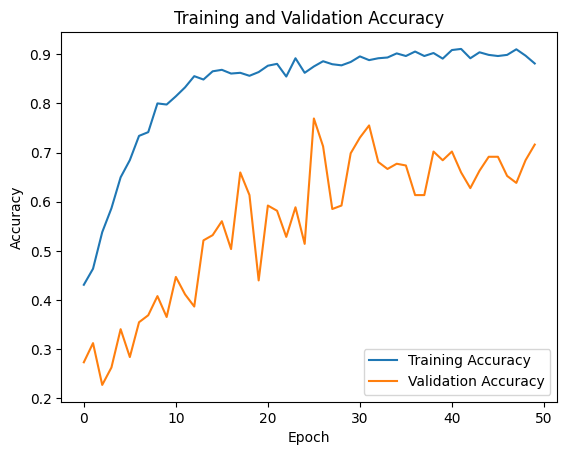

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
import matplotlib.pyplot as plt

# Directory tempat model akan disimpan
checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback untuk menyimpan model pada epoch tertentu
def save_model_at_epoch(epoch, logs):
    if epoch in [19, 29, 49]:  # Epoch dalam callback dimulai dari 0
        model_save_path = os.path.join(checkpoint_dir, f'model_adam_2_epoch_{epoch+1}.h5')
        model_adam_2.save(model_save_path)
        print(f'\nModel saved at epoch {epoch+1} to {model_save_path}')

save_model_callback = LambdaCallback(on_epoch_end=save_model_at_epoch)

# Batch size untuk pelatihan model
batch_size = 128

# Jumlah epoch yang akan dilakukan selama pelatihan
epochs = 50

# Callback checkpoint_callback dan save_model_callback digunakan untuk menyimpan model terbaik selama pelatihan
history = model_adam_2.fit(X_train, y_train, batch_size=batch_size,
                    epochs=epochs, validation_data=(X_val, y_val),
                    callbacks=[save_model_callback])

# Plot training dan validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training dan validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Training model optimizer Adamax

Epoch 1/50
11/11 [==============================] - 6s 280ms/step - loss: 1.9887 - accuracy: 0.3951 - val_loss: 3.7244 - val_accuracy: 0.2872
Epoch 2/50
11/11 [==============================] - 3s 250ms/step - loss: 1.1301 - accuracy: 0.4650 - val_loss: 2.0854 - val_accuracy: 0.3121
Epoch 3/50
11/11 [==============================] - 3s 246ms/step - loss: 0.9761 - accuracy: 0.5319 - val_loss: 1.9144 - val_accuracy: 0.3440
Epoch 4/50
11/11 [==============================] - 2s 221ms/step - loss: 0.8235 - accuracy: 0.6026 - val_loss: 1.7028 - val_accuracy: 0.2589
Epoch 5/50
11/11 [==============================] - 3s 231ms/step - loss: 0.7498 - accuracy: 0.6284 - val_loss: 1.5157 - val_accuracy: 0.3014
Epoch 6/50
11/11 [==============================] - 2s 222ms/step - loss: 0.5985 - accuracy: 0.6915 - val_loss: 1.4838 - val_accuracy: 0.3936
Epoch 7/50
11/11 [==============================] - 2s 222ms/step - loss: 0.5688 - accuracy: 0.6960 - val_loss: 1.4875 - val_accuracy: 0.4504
Epoch 

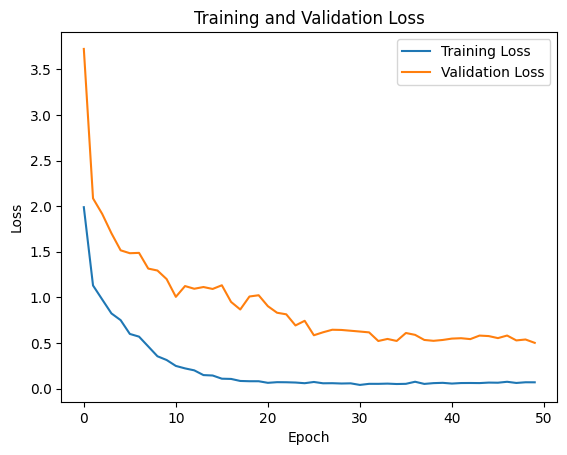

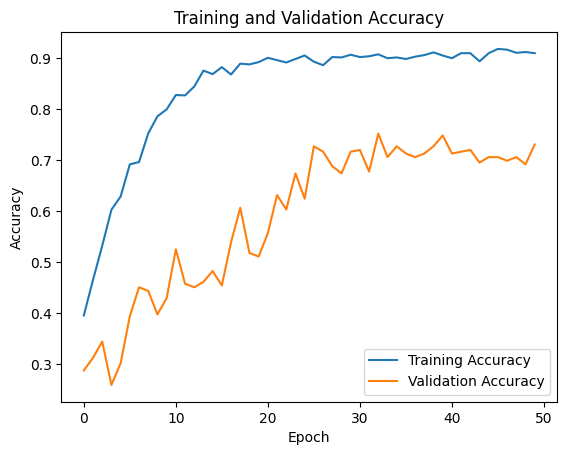

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
import matplotlib.pyplot as plt

# Directory tempat model akan disimpan
checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback untuk menyimpan model pada epoch tertentu
def save_model_at_epoch(epoch, logs):
    if epoch in [19, 29, 49]:  # Epoch dalam callback dimulai dari 0
        model_save_path = os.path.join(checkpoint_dir, f'model_adamax_1_epoch_{epoch+1}.h5')
        model_adamax_1.save(model_save_path)
        print(f'\nModel saved at epoch {epoch+1} to {model_save_path}')

save_model_callback = LambdaCallback(on_epoch_end=save_model_at_epoch)

# Batch size untuk pelatihan model
batch_size = 128

# Jumlah epoch yang akan dilakukan selama pelatihan
epochs = 50

# Callback checkpoint_callback dan save_model_callback digunakan untuk menyimpan model terbaik selama pelatihan
history = model_adamax_1.fit(X_train, y_train, batch_size=batch_size,
                    epochs=epochs, validation_data=(X_val, y_val),
                    callbacks=[save_model_callback])

# Plot training dan validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training dan validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Epoch 1/50
21/21 [==============================] - 10s 147ms/step - loss: 1.4395 - accuracy: 0.4491 - val_loss: 3.5942 - val_accuracy: 0.2730
Epoch 2/50
21/21 [==============================] - 3s 123ms/step - loss: 0.9841 - accuracy: 0.5327 - val_loss: 3.4364 - val_accuracy: 0.2199
Epoch 3/50
21/21 [==============================] - 3s 123ms/step - loss: 0.7592 - accuracy: 0.6254 - val_loss: 2.4398 - val_accuracy: 0.2340
Epoch 4/50
21/21 [==============================] - 3s 136ms/step - loss: 0.5847 - accuracy: 0.6976 - val_loss: 1.6542 - val_accuracy: 0.2730
Epoch 5/50
21/21 [==============================] - 3s 133ms/step - loss: 0.4696 - accuracy: 0.7302 - val_loss: 1.6466 - val_accuracy: 0.3262
Epoch 6/50
21/21 [==============================] - 3s 124ms/step - loss: 0.3931 - accuracy: 0.7652 - val_loss: 1.1898 - val_accuracy: 0.4681
Epoch 7/50
21/21 [==============================] - 3s 125ms/step - loss: 0.3151 - accuracy: 0.7910 - val_loss: 0.9746 - val_accuracy: 0.5213
Epoch

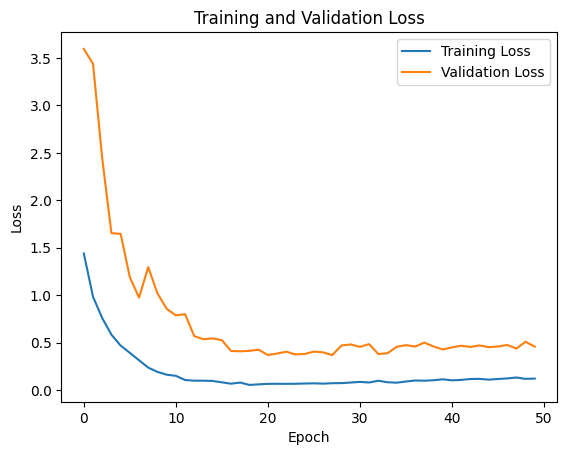

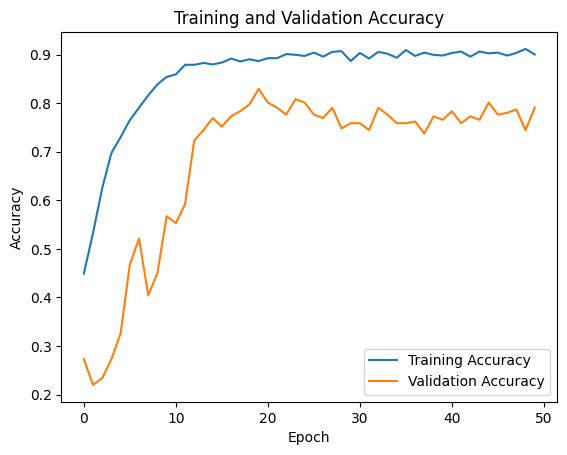

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
import matplotlib.pyplot as plt

# Directory tempat model akan disimpan
checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback untuk menyimpan model pada epoch tertentu
def save_model_at_epoch(epoch, logs):
    if epoch in [19, 29, 49]:  # Epoch dalam callback dimulai dari 0
        model_save_path = os.path.join(checkpoint_dir, f'model_adamax_2_epoch_{epoch+1}.h5')
        model_adamax_2.save(model_save_path)
        print(f'\nModel saved at epoch {epoch+1} to {model_save_path}')

save_model_callback = LambdaCallback(on_epoch_end=save_model_at_epoch)

# Batch size untuk pelatihan model
batch_size = 64

# Jumlah epoch yang akan dilakukan selama pelatihan
epochs = 50

# Callback checkpoint_callback dan save_model_callback digunakan untuk menyimpan model terbaik selama pelatihan
history = model_adamax_2.fit(X_train, y_train, batch_size=batch_size,
                    epochs=epochs, validation_data=(X_val, y_val),
                    callbacks=[save_model_callback])

# Plot training dan validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training dan validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


#Evaluasi model pada data test

Model tanpa optimizer

9/9 [==============================] - 0s 25ms/step - loss: 0.7119 - accuracy: 0.6312

Model at Epoch 20 Test Accuracy: 0.631205677986145


9/9 [==============================] - 0s 20ms/step
Accuracy: 0.6312056737588653
Precision: 0.7444855926405128
F1 Score: 0.5790873554350623
Classification Report:
              precision    recall  f1-score   support

        corn       1.00      0.20      0.33        82
      cotton       0.63      0.91      0.75        89
        rice       0.78      0.43      0.55        49
       wheat       0.54      0.97      0.69        62

    accuracy                           0.63       282
   macro avg       0.74      0.63      0.58       282
weighted avg       0.74      0.63      0.58       282



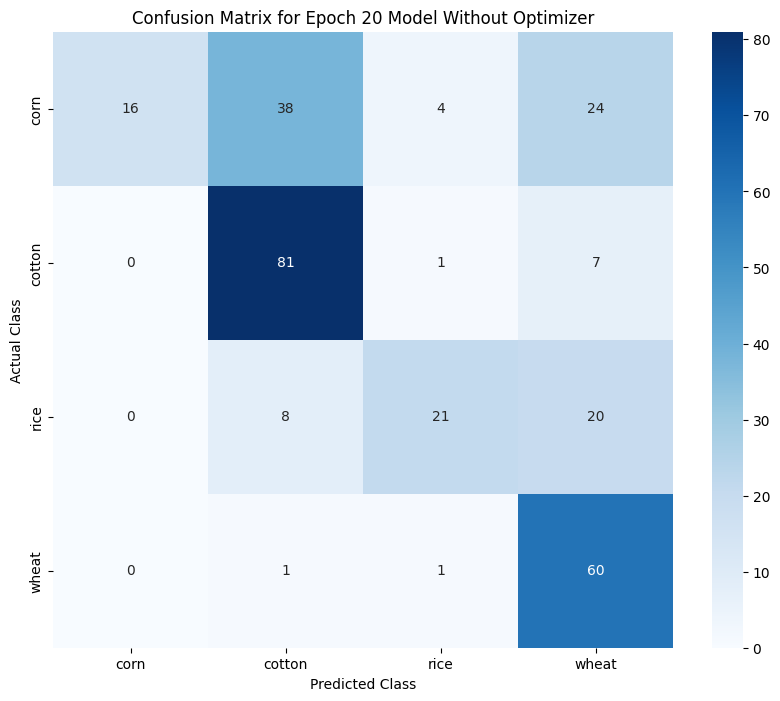

9/9 [==============================] - 1s 29ms/step - loss: 0.7239 - accuracy: 0.6560

Model at Epoch 30 Test Accuracy: 0.6560283899307251
9/9 [==============================] - 1s 31ms/step
Accuracy: 0.6560283687943262
Precision: 0.7445611803858125
F1 Score: 0.655520189648416
Classification Report:
              precision    recall  f1-score   support

        corn       0.91      0.59      0.71        82
      cotton       0.73      0.81      0.77        89
        rice       0.42      0.88      0.57        49
       wheat       0.81      0.35      0.49        62

    accuracy                           0.66       282
   macro avg       0.72      0.66      0.63       282
weighted avg       0.74      0.66      0.66       282



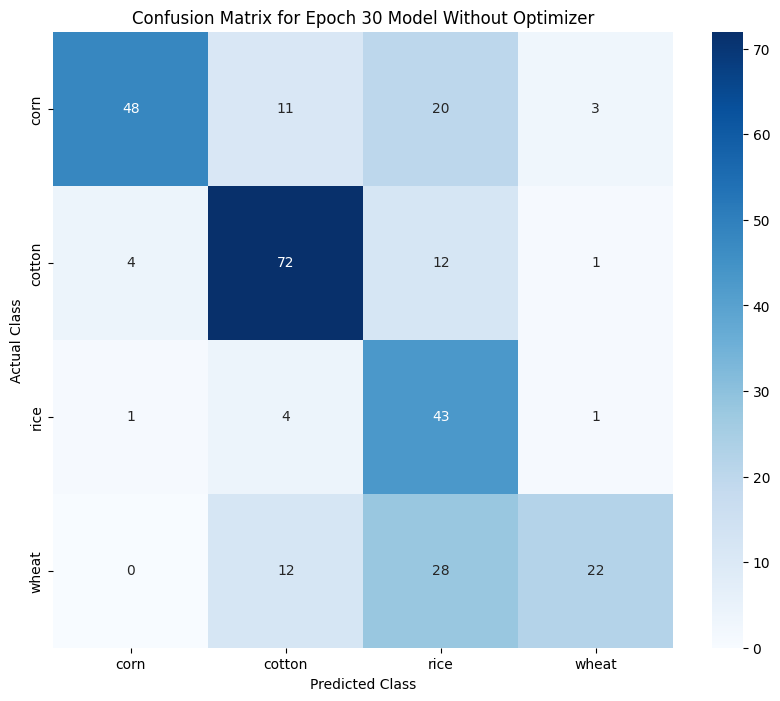

9/9 [==============================] - 1s 30ms/step - loss: 0.6176 - accuracy: 0.7199

Model at Epoch 50 Test Accuracy: 0.7198581695556641
9/9 [==============================] - 1s 22ms/step
Accuracy: 0.7198581560283688
Precision: 0.7724889337959272
F1 Score: 0.7117035259375576
Classification Report:
              precision    recall  f1-score   support

        corn       0.71      0.66      0.68        82
      cotton       0.96      0.49      0.65        89
        rice       0.57      0.96      0.71        49
       wheat       0.75      0.94      0.83        62

    accuracy                           0.72       282
   macro avg       0.75      0.76      0.72       282
weighted avg       0.77      0.72      0.71       282



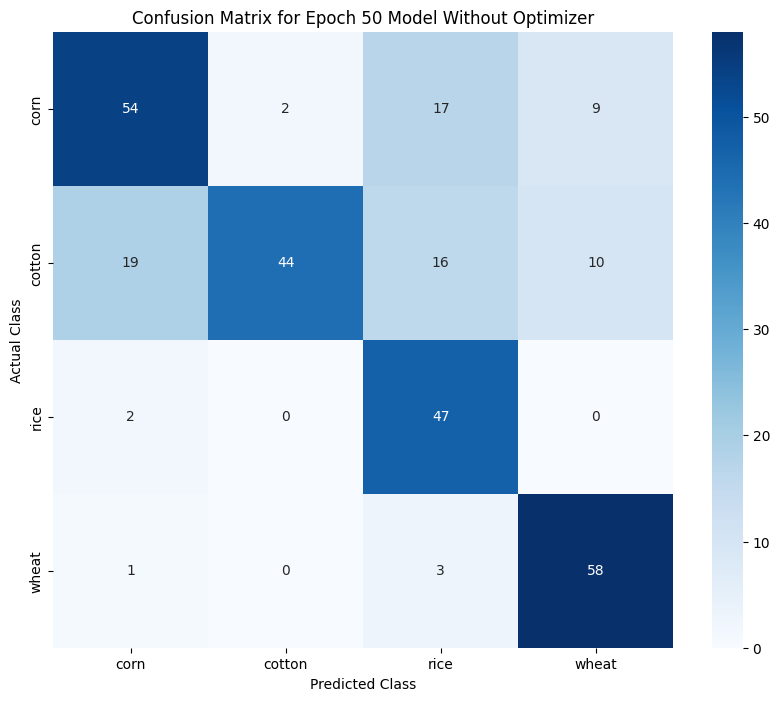

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_at_epoch(epoch):
    checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
    model_filepath = os.path.join(checkpoint_dir, f'model_without_optimizer_epoch_{epoch}.h5')
    model = load_model(model_filepath)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    report = classification_report(y_true, y_pred, target_names=['corn', 'cotton', 'rice', 'wheat'])
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1 Score: {f1}')
    print(f'Classification Report:\n{report}')

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['corn', 'cotton', 'rice', 'wheat'], yticklabels=['corn', 'cotton', 'rice', 'wheat'])
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title(f'Confusion Matrix for Epoch {epoch} Model Without Optimizer')
    plt.show()

# Evaluasi model pada epoch 20, 30, dan 50
for epoch in [20, 30, 50]:
    evaluate_model_at_epoch(epoch)


Model optimizer Adam learning rate=0.001

9/9 [==============================] - 0s 25ms/step - loss: 0.9041 - accuracy: 0.5213

Model at Epoch 20 Test Accuracy: 0.521276593208313
9/9 [==============================] - 0s 20ms/step
Accuracy: 0.5212765957446809
Precision: 0.6891029628991555
F1 Score: 0.4288202620335306
Classification Report:
              precision    recall  f1-score   support

        corn       1.00      0.02      0.05        82
      cotton       0.49      0.93      0.64        89
        rice       0.51      0.82      0.63        49
       wheat       0.71      0.35      0.47        62

    accuracy                           0.52       282
   macro avg       0.68      0.53      0.45       282
weighted avg       0.69      0.52      0.43       282



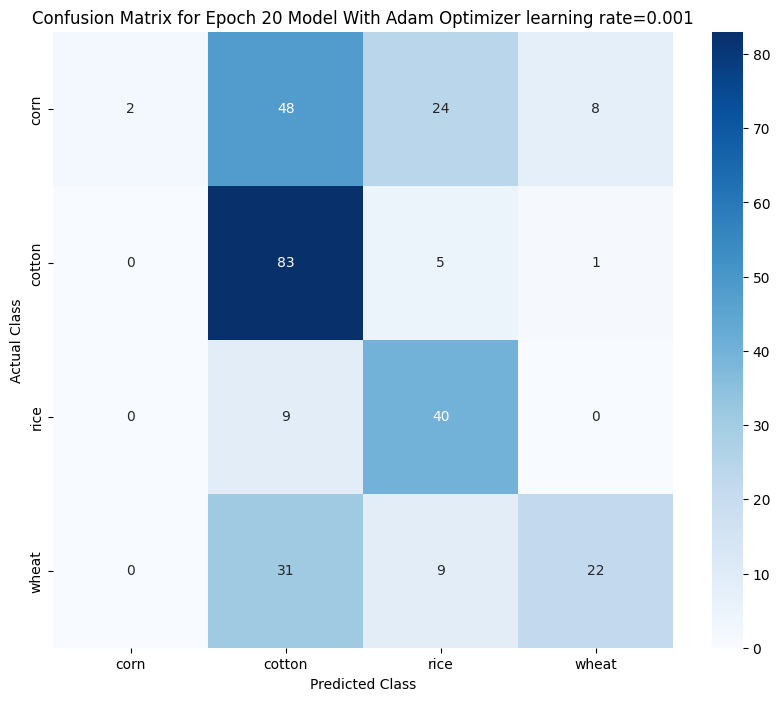

9/9 [==============================] - 0s 21ms/step - loss: 1.0181 - accuracy: 0.4220

Model at Epoch 30 Test Accuracy: 0.42198580503463745
9/9 [==============================] - 0s 18ms/step
Accuracy: 0.4219858156028369
Precision: 0.6489981898572659
F1 Score: 0.34099383503898295
Classification Report:
              precision    recall  f1-score   support

        corn       0.75      0.07      0.13        82
      cotton       0.36      0.98      0.53        89
        rice       0.68      0.35      0.46        49
       wheat       0.90      0.15      0.25        62

    accuracy                           0.42       282
   macro avg       0.67      0.39      0.34       282
weighted avg       0.65      0.42      0.34       282



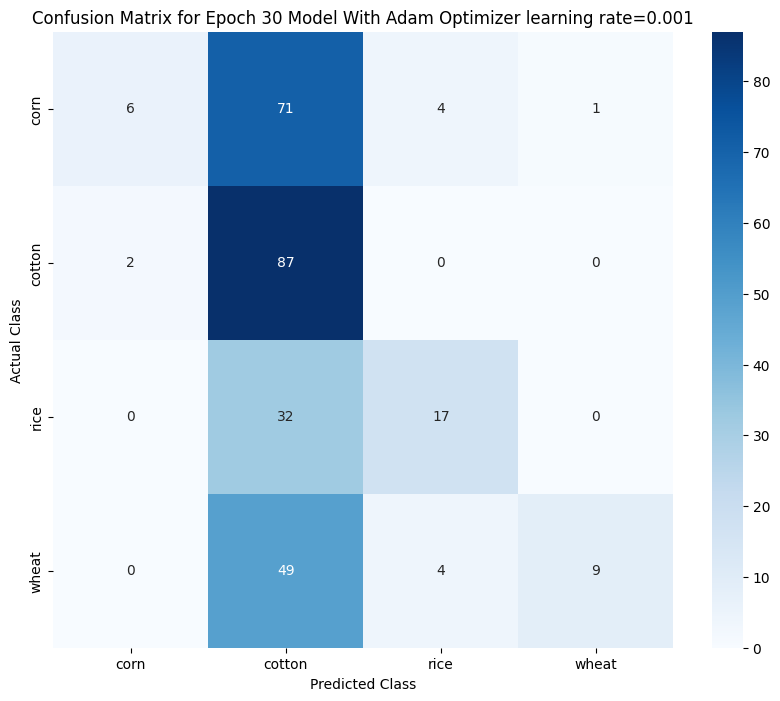

9/9 [==============================] - 0s 25ms/step - loss: 0.6041 - accuracy: 0.6844

Model at Epoch 50 Test Accuracy: 0.6843971610069275
9/9 [==============================] - 0s 21ms/step
Accuracy: 0.6843971631205674
Precision: 0.766331003081179
F1 Score: 0.6680274739845872
Classification Report:
              precision    recall  f1-score   support

        corn       0.91      0.49      0.63        82
      cotton       0.66      0.97      0.78        89
        rice       0.53      0.86      0.65        49
       wheat       0.93      0.40      0.56        62

    accuracy                           0.68       282
   macro avg       0.75      0.68      0.66       282
weighted avg       0.77      0.68      0.67       282



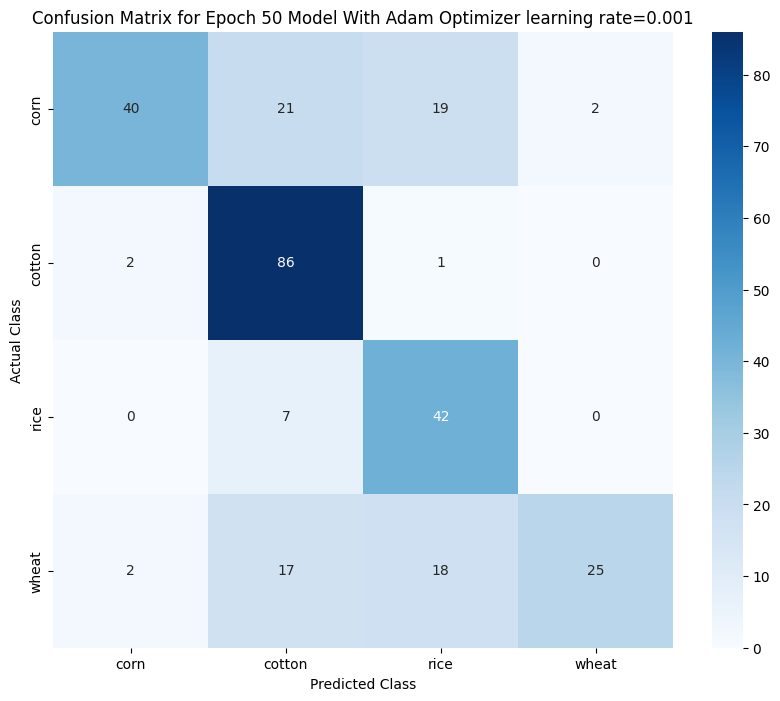

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_at_epoch(epoch):
    checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
    model_filepath = os.path.join(checkpoint_dir, f'model_adam_1_epoch_{epoch}.h5')
    model = load_model(model_filepath)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    report = classification_report(y_true, y_pred, target_names=['corn', 'cotton', 'rice', 'wheat'])
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1 Score: {f1}')
    print(f'Classification Report:\n{report}')

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['corn', 'cotton', 'rice', 'wheat'], yticklabels=['corn', 'cotton', 'rice', 'wheat'])
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title(f'Confusion Matrix for Epoch {epoch} Model With Adam Optimizer learning rate=0.001')
    plt.show()

# Evaluasi model pada epoch 20, 30, dan 50
for epoch in [20, 30, 50]:
    evaluate_model_at_epoch(epoch)


Model optimizer Adam learning rate = 0.0001

9/9 [==============================] - 0s 25ms/step - loss: 1.3468 - accuracy: 0.4433

Model at Epoch 20 Test Accuracy: 0.44326239824295044
9/9 [==============================] - 0s 24ms/step
Accuracy: 0.4432624113475177
Precision: 0.7271525803183319
F1 Score: 0.33411539556721026
Classification Report:
              precision    recall  f1-score   support

        corn       1.00      0.10      0.18        82
      cotton       0.40      0.98      0.57        89
        rice       0.52      0.59      0.55        49
       wheat       1.00      0.02      0.03        62

    accuracy                           0.44       282
   macro avg       0.73      0.42      0.33       282
weighted avg       0.73      0.44      0.33       282



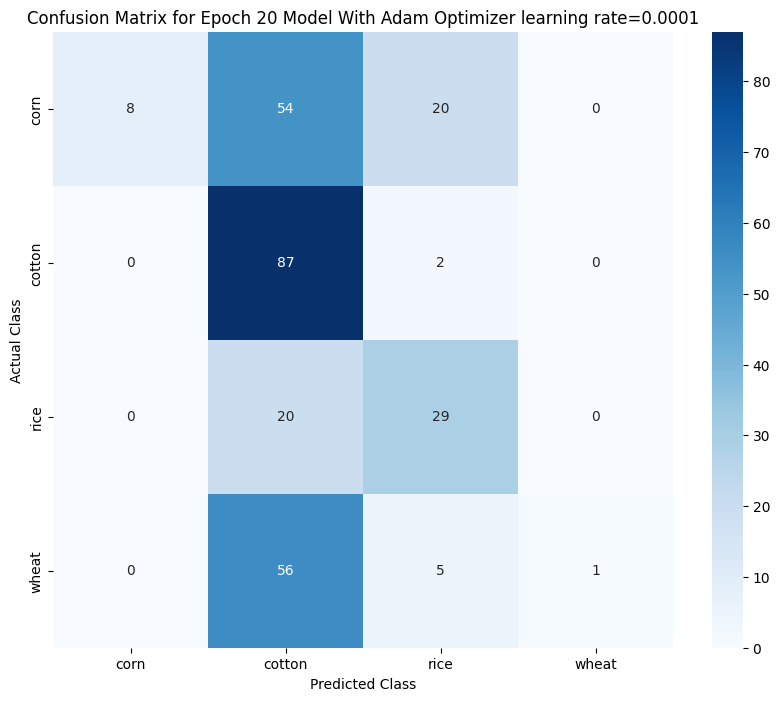

9/9 [==============================] - 1s 27ms/step - loss: 0.4720 - accuracy: 0.7305

Model at Epoch 30 Test Accuracy: 0.7304964661598206
9/9 [==============================] - 0s 26ms/step
Accuracy: 0.7304964539007093
Precision: 0.7957330276133252
F1 Score: 0.7043314886365386
Classification Report:
              precision    recall  f1-score   support

        corn       0.96      0.32      0.48        82
      cotton       0.73      0.91      0.81        89
        rice       0.56      0.94      0.70        49
       wheat       0.85      0.85      0.85        62

    accuracy                           0.73       282
   macro avg       0.78      0.76      0.71       282
weighted avg       0.80      0.73      0.70       282



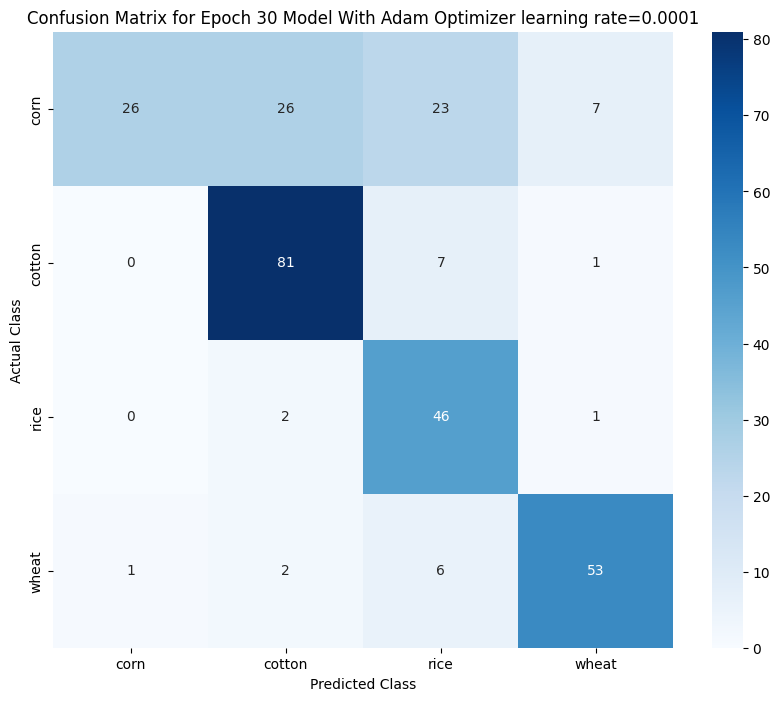

9/9 [==============================] - 0s 23ms/step - loss: 0.6445 - accuracy: 0.6879

Model at Epoch 50 Test Accuracy: 0.6879432797431946
9/9 [==============================] - 0s 21ms/step
Accuracy: 0.6879432624113475
Precision: 0.7430233000141815
F1 Score: 0.6850262404100175
Classification Report:
              precision    recall  f1-score   support

        corn       0.69      0.61      0.65        82
      cotton       0.96      0.53      0.68        89
        rice       0.56      0.88      0.68        49
       wheat       0.64      0.87      0.74        62

    accuracy                           0.69       282
   macro avg       0.71      0.72      0.69       282
weighted avg       0.74      0.69      0.69       282



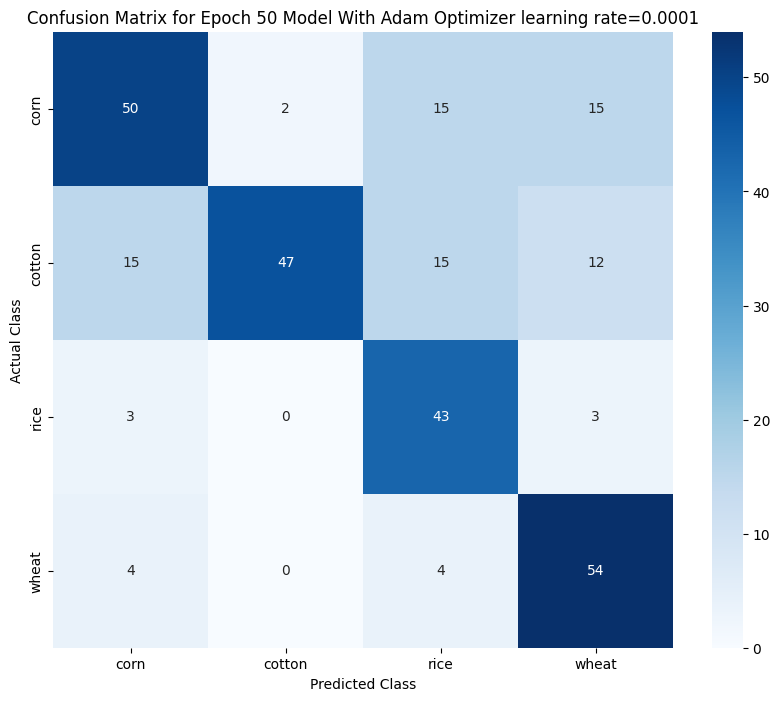

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

def evaluate_model_at_epoch(epoch):
    checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
    model_filepath = os.path.join(checkpoint_dir, f'model_adam_2_epoch_{epoch}.h5')
    model = load_model(model_filepath)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    report = classification_report(y_true, y_pred, target_names=['corn', 'cotton', 'rice', 'wheat'])
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1 Score: {f1}')
    print(f'Classification Report:\n{report}')

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['corn', 'cotton', 'rice', 'wheat'], yticklabels=['corn', 'cotton', 'rice', 'wheat'])
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title(f'Confusion Matrix for Epoch {epoch} Model With Adam Optimizer learning rate=0.0001')
    plt.show()

# Evaluasi model pada epoch 20, 30, dan 50
for epoch in [20, 30, 50]:
    evaluate_model_at_epoch(epoch)


Model optimizer Adamax learning rate = 0.001

9/9 [==============================] - 0s 23ms/step - loss: 0.8859 - accuracy: 0.5355

Model at Epoch 20 Test Accuracy: 0.5354610085487366
9/9 [==============================] - 0s 21ms/step
Accuracy: 0.5354609929078015
Precision: 0.7141528052875571
F1 Score: 0.4317655936696161
Classification Report:
              precision    recall  f1-score   support

        corn       1.00      0.02      0.05        82
      cotton       0.47      0.98      0.64        89
        rice       0.79      0.22      0.35        49
       wheat       0.63      0.82      0.71        62

    accuracy                           0.54       282
   macro avg       0.72      0.51      0.44       282
weighted avg       0.71      0.54      0.43       282



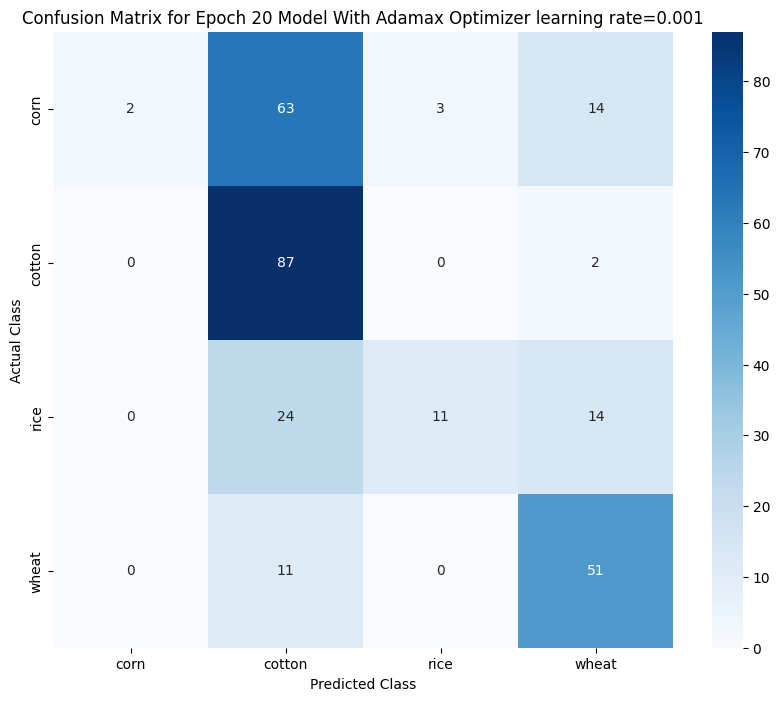

9/9 [==============================] - 0s 24ms/step - loss: 0.5754 - accuracy: 0.6879

Model at Epoch 30 Test Accuracy: 0.6879432797431946
9/9 [==============================] - 0s 18ms/step
Accuracy: 0.6879432624113475
Precision: 0.7295889613979454
F1 Score: 0.6595503052921012
Classification Report:
              precision    recall  f1-score   support

        corn       0.90      0.32      0.47        82
      cotton       0.69      0.96      0.80        89
        rice       0.62      0.65      0.63        49
       wheat       0.66      0.82      0.73        62

    accuracy                           0.69       282
   macro avg       0.71      0.69      0.66       282
weighted avg       0.73      0.69      0.66       282



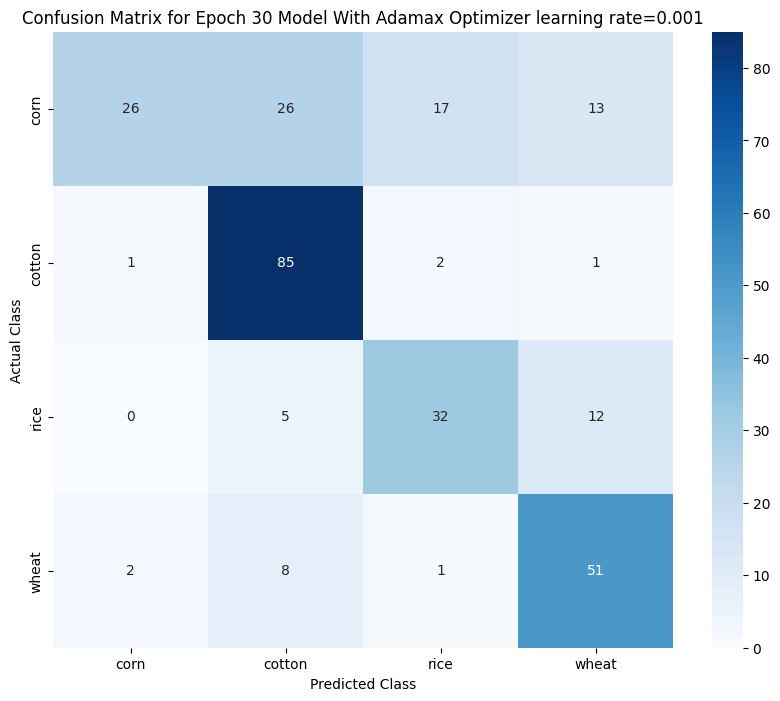

9/9 [==============================] - 0s 21ms/step - loss: 0.4737 - accuracy: 0.7234

Model at Epoch 50 Test Accuracy: 0.7234042286872864
9/9 [==============================] - 0s 19ms/step
Accuracy: 0.723404255319149
Precision: 0.7547175452041825
F1 Score: 0.7195534064044703
Classification Report:
              precision    recall  f1-score   support

        corn       0.80      0.49      0.61        82
      cotton       0.81      0.79      0.80        89
        rice       0.54      0.92      0.68        49
       wheat       0.78      0.79      0.78        62

    accuracy                           0.72       282
   macro avg       0.73      0.75      0.72       282
weighted avg       0.75      0.72      0.72       282



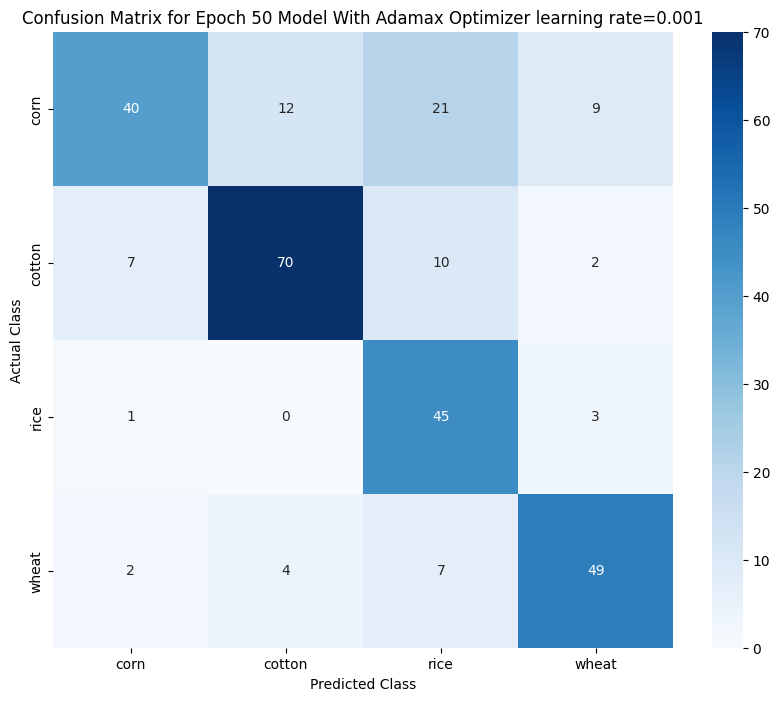

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_at_epoch(epoch):
    checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
    model_filepath = os.path.join(checkpoint_dir, f'model_adamax_1_epoch_{epoch}.h5')
    model = load_model(model_filepath)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    report = classification_report(y_true, y_pred, target_names=['corn', 'cotton', 'rice', 'wheat'])
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1 Score: {f1}')
    print(f'Classification Report:\n{report}')

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['corn', 'cotton', 'rice', 'wheat'], yticklabels=['corn', 'cotton', 'rice', 'wheat'])
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title(f'Confusion Matrix for Epoch {epoch} Model With Adamax Optimizer learning rate=0.001')
    plt.show()

# Evaluasi model pada epoch 20, 30, dan 50
for epoch in [20, 30, 50]:
    evaluate_model_at_epoch(epoch)


Model optimizer Adamax learning rate = 0.0001

9/9 [==============================] - 1s 27ms/step - loss: 0.4069 - accuracy: 0.8191

Model at Epoch 20 Test Accuracy: 0.8191489577293396
9/9 [==============================] - 0s 24ms/step
Accuracy: 0.8191489361702128
Precision: 0.8158709382626421
F1 Score: 0.814119380353523
Classification Report:
              precision    recall  f1-score   support

        corn       0.78      0.63      0.70        82
      cotton       0.86      0.96      0.90        89
        rice       0.80      0.90      0.85        49
       wheat       0.82      0.81      0.81        62

    accuracy                           0.82       282
   macro avg       0.81      0.82      0.82       282
weighted avg       0.82      0.82      0.81       282



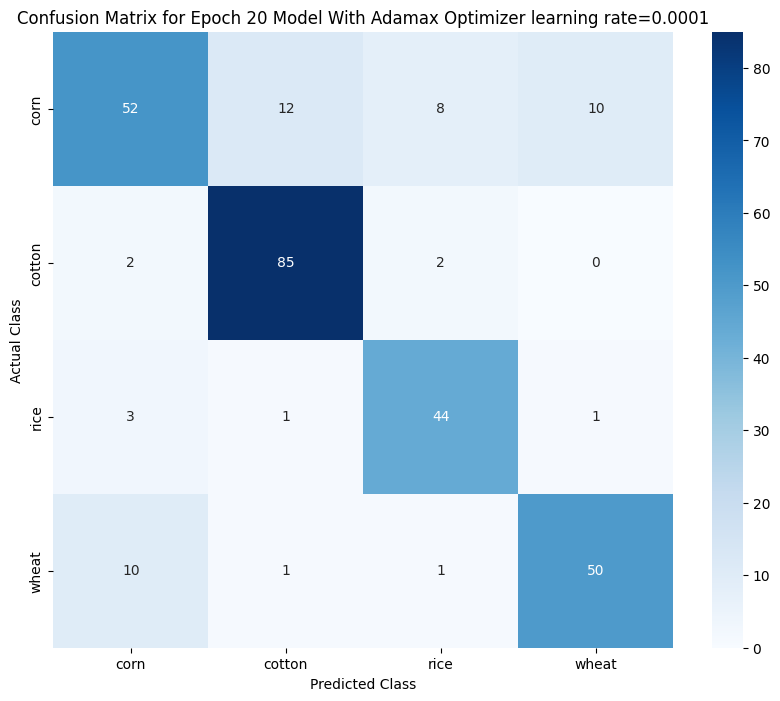

9/9 [==============================] - 1s 28ms/step - loss: 0.4076 - accuracy: 0.7411

Model at Epoch 30 Test Accuracy: 0.741134762763977
9/9 [==============================] - 0s 20ms/step
Accuracy: 0.7411347517730497
Precision: 0.780155307733627
F1 Score: 0.7295631682455767
Classification Report:
              precision    recall  f1-score   support

        corn       0.88      0.43      0.57        82
      cotton       0.82      0.88      0.85        89
        rice       0.56      0.94      0.70        49
       wheat       0.77      0.81      0.79        62

    accuracy                           0.74       282
   macro avg       0.76      0.76      0.73       282
weighted avg       0.78      0.74      0.73       282



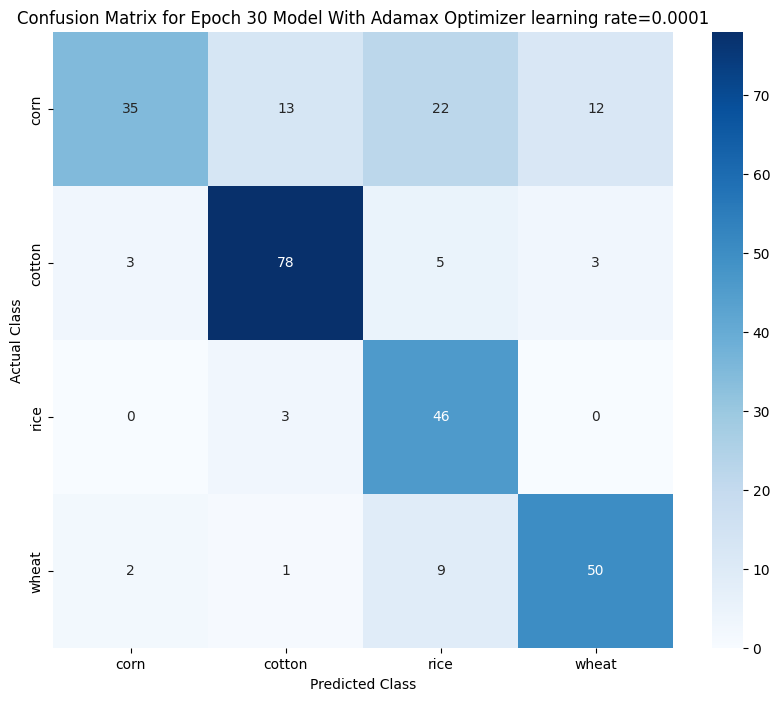

9/9 [==============================] - 0s 26ms/step - loss: 0.4513 - accuracy: 0.7624

Model at Epoch 50 Test Accuracy: 0.76241135597229
9/9 [==============================] - 0s 20ms/step
Accuracy: 0.7624113475177305
Precision: 0.7867638693028334
F1 Score: 0.7544451460894809
Classification Report:
              precision    recall  f1-score   support

        corn       0.87      0.50      0.64        82
      cotton       0.81      0.89      0.84        89
        rice       0.61      0.90      0.73        49
       wheat       0.78      0.82      0.80        62

    accuracy                           0.76       282
   macro avg       0.77      0.78      0.75       282
weighted avg       0.79      0.76      0.75       282



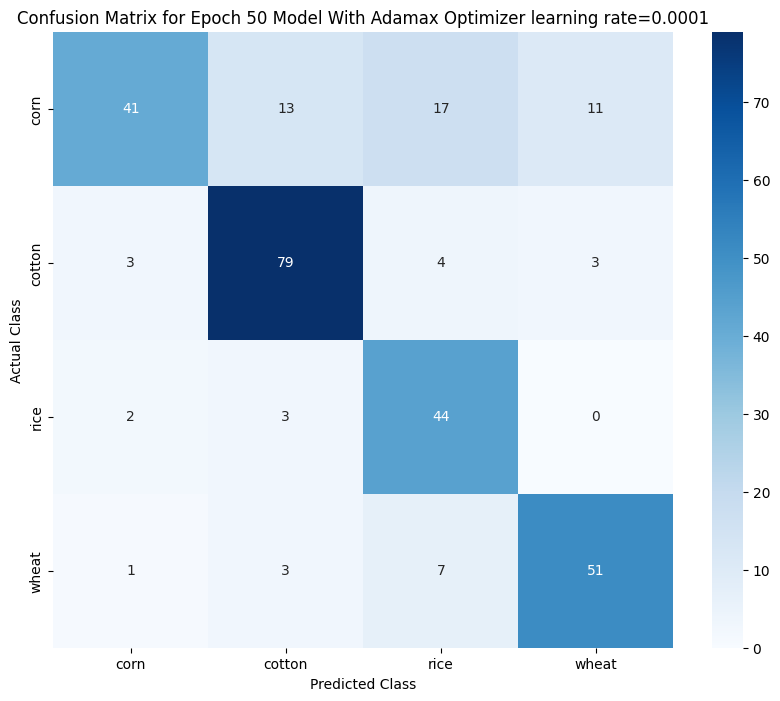

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_at_epoch(epoch):
    checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
    model_filepath = os.path.join(checkpoint_dir, f'model_adamax_2_epoch_{epoch}.h5')
    model = load_model(model_filepath)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    report = classification_report(y_true, y_pred, target_names=['corn', 'cotton', 'rice', 'wheat'])
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1 Score: {f1}')
    print(f'Classification Report:\n{report}')

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['corn', 'cotton', 'rice', 'wheat'], yticklabels=['corn', 'cotton', 'rice', 'wheat'])
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title(f'Confusion Matrix for Epoch {epoch} Model With Adamax Optimizer learning rate=0.0001')
    plt.show()

# Evaluasi model pada epoch 20, 30, dan 50
for epoch in [20, 30, 50]:
    evaluate_model_at_epoch(epoch)


#Visualisasi prediksi model

https://crops-classification-cnn-jp3fg5twp2are5pd7p9ggn.streamlit.app/

9/9 [==============================] - 0s 22ms/step - loss: 0.4069 - accuracy: 0.8191

Model at Epoch 50 Test Accuracy: 0.8191489577293396
9/9 [==============================] - 0s 20ms/step


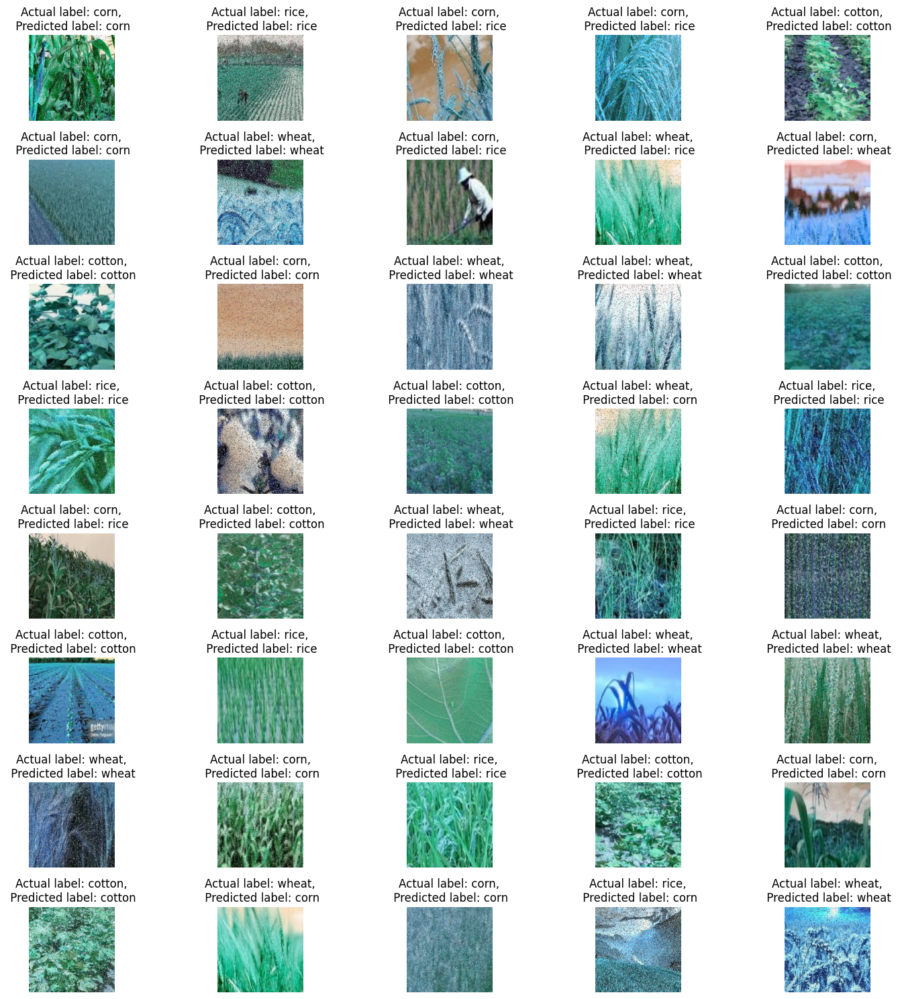

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

checkpoint_dir = '/content/drive/My Drive/pcd_crop_multiclass/'
model_filepath = os.path.join(checkpoint_dir, f'model_adamax_2_epoch_20.h5')
model = load_model(model_filepath)

test_loss, test_acc = model.evaluate(X_test, y_test)
print(f'\nModel at Epoch {epoch} Test Accuracy: {test_acc}')
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

labels_map = {0: 'corn', 1: 'cotton', 2:'rice', 3: 'wheat'}

num_samples = 40

indices = np.random.choice(len(X_test), num_samples, replace=False)

sample_images = X_test[indices]
sample_true_labels = y_true[indices]
sample_pred_labels = y_pred[indices]

fig, axes = plt.subplots(8, 5, figsize=(15, 15))
axes = axes.flatten()

for i, (img, true_label, pred_label) in enumerate(zip(sample_images, sample_true_labels, sample_pred_labels)):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'Actual label: {labels_map[true_label]},\n Predicted label: {labels_map[pred_label]}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()
